<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;">FMST Project

• **DOMAIN:** Semiconductor manufacturing process

• **CONTEXT:** A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/
variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific 
monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers 
typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature 
selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors 
contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning 
and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out 
different combinations of features, essential signals that are impacting the yield type can be identified.

• **DATA DESCRIPTION:** sensor-data.csv : (1567, 592)

The data consists of 1567 examples each with 591 features. 
The dataset presented in this case represents a selection of such features where each example represents a single production entity with 
associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to 
a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.

• **PROJECT OBJECTIVE:** We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the 
features are required to build the model or not

In [2]:
# Importing Libreries
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [3]:
os.chdir('D:\\AIML\\GL_Projects\\FMT')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 1.Importing datasets

In [4]:
df = pd.read_csv('signal-data.csv')
print(f'shape of data is : {df.shape}')
print(f'size of data is : {df.size}')

shape of data is : (1567, 592)
size of data is : 927664


In [5]:
df.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [6]:
# columns are numbers only, it will create problem in future.
# Lets add word "sensor" prefix to numbers

df.columns = "sensor_"+df.columns
df.head()

,sensor_Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,...,sensor_581,sensor_582,sensor_583,sensor_584,sensor_585,sensor_586,sensor_587,sensor_588,sensor_589,sensor_Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [7]:
#Rename the time column and Pass_Fail column as they are not features 
df.rename(columns = {'sensor_Time':'Time'}, inplace = True) 
df.rename(columns = {'sensor_Pass/Fail':'Pass_Fail'}, inplace = True)

In [8]:
df.head()

,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,...,sensor_581,sensor_582,sensor_583,sensor_584,sensor_585,sensor_586,sensor_587,sensor_588,sensor_589,Pass_Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


In [9]:
# Widen the display of python output
# This is done to avoid ellipsis appearing which restricts output view in row or column
import pandas as pd
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass_Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sensor_0,1561.0,3014.452896,73.621787,2743.2400,2966.260000,3011.49000,3056.650000,3356.3500
sensor_1,1560.0,2495.850231,80.407705,2158.7500,2452.247500,2499.40500,2538.822500,2846.4400
sensor_2,1553.0,2200.547318,29.513152,2060.6600,2181.044400,2201.06670,2218.055500,2315.2667
sensor_3,1553.0,1396.376627,441.691640,0.0000,1081.875800,1285.21440,1591.223500,3715.0417
sensor_4,1553.0,4.197013,56.355540,0.6815,1.017700,1.31680,1.525700,1114.5366
sensor_5,1553.0,100.000000,0.000000,100.0000,100.000000,100.00000,100.000000,100.0000
sensor_6,1553.0,101.112908,6.237214,82.1311,97.920000,101.51220,104.586700,129.2522
sensor_7,1558.0,0.121822,0.008961,0.0000,0.121100,0.12240,0.123800,0.1286
sensor_8,1565.0,1.462862,0.073897,1.1910,1.411200,1.46160,1.516900,1.6564
sensor_9,1565.0,-0.000841,0.015116,-0.0534,-0.010800,-0.00130,0.008400,0.0749


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 2) Data cleansing: 

In [12]:

    # Checking for missing values

    val=df.isnull().values.any()

    if val==True:
        print("Missing values present : ", df.isnull().values.sum())
    else:
        print("No missing values present")

**There are 41951 missing values in overall data. We will impute these null values with median instead of dropping them.**

We could observe that, there are no null/missing values now.

In [13]:
df.duplicated().sum()

Missing values present :  41951


0

There are no duplicates in the dataset.

In [14]:
df.columns

Index(['Time', 'sensor_0', 'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5', 'sensor_6', 'sensor_7', 'sensor_8',
       ...
       'sensor_581', 'sensor_582', 'sensor_583', 'sensor_584', 'sensor_585', 'sensor_586', 'sensor_587', 'sensor_588', 'sensor_589', 'Pass_Fail'], dtype='object', length=592)

**Dropping columns whose null numbers are greater than equal to 50% of total cells. Because these attributes doesn't help in prediction, instead leads to curse of dimentionslaity.**

In [15]:
df2 = df.drop(df.columns[df.apply(lambda col: (col.isnull().sum() / df.shape[0] * 100) >= 50)],axis=1)
df2.head()

,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,sensor_52,sensor_53,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63,sensor_64,sensor_65,sensor_66,sensor_67,sensor_68,sensor_69,sensor_70,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_96,sensor_97,sensor_98,sensor_99,sensor_100,sensor_101,sensor_102,sensor_103,sensor_104,sensor_105,sensor_106,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_123,sensor_124,sensor_125,sensor_126,sensor_127,sensor_128,sensor_129,sensor_130,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_140,sensor_141,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_147,sensor_148,sensor_149,sensor_150,sensor_151,sensor_152,sensor_153,sensor_154,sensor_155,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_163,sensor_164,sensor_165,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_174,sensor_175,sensor_176,sensor_177,sensor_178,sensor_179,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_185,sensor_186,sensor_187,sensor_188,sensor_189,sensor_190,sensor_191,sensor_192,sensor_193,sensor_194,sensor_195,sensor_196,sensor_197,sensor_198,sensor_199,sensor_200,sensor_201,sensor_202,sensor_203,sensor_204,sensor_205,sensor_206,sensor_207,sensor_208,sensor_209,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_224,sensor_225,sensor_226,sensor_227,sensor_228,sensor_229,sensor_230,sensor_231,sensor_232,sensor_233,sensor_234,sensor_235,sensor_236,sensor_237,sensor_238,sensor_239,sensor_240,sensor_241,sensor_242,sensor_243,sensor_247,sensor_248,sensor_249,sensor_250,sensor_251,sensor_252,sensor_253,sensor_254,sensor_255,sensor_256,sensor_257,sensor_258,sensor_259,sensor_260,sensor_261,sensor_262,sensor_263,sensor_264,sensor_265,sensor_266,sensor_267,sensor_268,sensor_269,sensor_270,sensor_271,sensor_272,sensor_273,sensor_274,sensor_275,sensor_276,sensor_277,sensor_278,sensor_279,sensor_280,sensor_281,sensor_282,sensor_283,sensor_284,sensor_285,sensor_286,sensor_287,sensor_288,sensor_289,sensor_290,sensor_291,sensor_294,sensor_295,sensor_296,sensor_297,sensor_298,sensor_299,sensor_300,sensor_301,sensor_302,sensor_303,sensor_304,sensor_305,sensor_306,sensor_307,sensor_308,sensor_309,sensor_310,sensor_311,sensor_312,sensor_313,sensor_314,sensor_315,sensor_316,sensor_317,sensor_318,sensor_319,sensor_320,sensor_321,sensor_322,sensor_323,sensor_324,sensor_325,sensor_326,sensor_327,sensor_328,sensor_329,sensor_330,sensor_331,sensor_332,sensor_333,sensor_334,sensor_335,sensor_336,sensor_337,sensor_338,sensor_339,sensor_340,sensor_341,sensor_342,sensor_343,sensor_344,sensor_347,sensor_348,sensor_349,sensor_350,sensor_351,sensor_352,sensor_353,sensor_354,sensor_355,sensor_356,sensor_357,sensor_359,sensor_360,sensor_361,sensor_362,sensor_363,sensor_364,sensor_365,sensor_366,sensor_367,sensor_368,sensor_369,sensor_370,sensor_371,sensor_372,sensor_373,sensor_374,sensor_375,sensor_376,sensor_377,sensor_378,sensor_379,sensor_380,sensor_381,sensor_385,sensor_386,sensor_387,sensor_388,sensor_389,sensor_390,sensor_391,sensor_39

In [16]:
df2.shape

(1567, 564)

Filling remaining columns null with median

In [17]:
# every column's missing value is replaced with that column's median respectively
# The fillna() function is used to fill NaN values using the specified method
df2.fillna(df2.median(),inplace = True )

In [18]:
print(f'Missing values after filling with median : {df2.isnull().values.sum()}')

Missing values after filling with median : 0


In [19]:
df2.iloc[0:5, 5:16]

,sensor_4,sensor_5,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14
0,1.3602,100.0,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,0.0,7.9558
1,0.8294,100.0,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,0.0,10.1548
2,1.5102,100.0,95.4878,0.1241,1.4436,0.0041,0.0013,0.9615,202.0179,0.0,9.5157
3,1.3204,100.0,104.2367,0.1217,1.4882,-0.0124,-0.0033,0.9629,201.8482,0.0,9.6052
4,1.5334,100.0,100.3967,0.1235,1.5031,-0.0031,-0.0072,0.9569,201.9424,0.0,10.5661


Observation : 

- sensor 5 and sensor 13 showing only single value.
- There could be many such single value features. 
- These features are not important and we can drop them. 

**Drop the features with single value in 1567 examples**

- Drop the features if length of unique values is equal to 1

In [20]:
df2 = df2.drop(df2.columns[df2.apply(lambda col: len(col.unique()) == 1)],axis=1)  
df2.head()

,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,sensor_26,sensor_27,sensor_28,sensor_29,sensor_30,sensor_31,sensor_32,sensor_33,sensor_34,sensor_35,sensor_36,sensor_37,sensor_38,sensor_39,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_50,sensor_51,sensor_53,sensor_54,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_60,sensor_61,sensor_62,sensor_63,sensor_64,sensor_65,sensor_66,sensor_67,sensor_68,sensor_70,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_96,sensor_98,sensor_99,sensor_100,sensor_101,sensor_102,sensor_103,sensor_104,sensor_105,sensor_106,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_123,sensor_124,sensor_125,sensor_126,sensor_127,sensor_128,sensor_129,sensor_130,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_140,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_147,sensor_148,sensor_150,sensor_151,sensor_152,sensor_153,sensor_154,sensor_155,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_163,sensor_164,sensor_165,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_174,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_185,sensor_187,sensor_188,sensor_195,sensor_196,sensor_197,sensor_198,sensor_199,sensor_200,sensor_201,sensor_202,sensor_203,sensor_204,sensor_205,sensor_206,sensor_207,sensor_208,sensor_209,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_224,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_248,sensor_249,sensor_250,sensor_251,sensor_252,sensor_253,sensor_254,sensor_255,sensor_267,sensor_268,sensor_269,sensor_270,sensor_271,sensor_272,sensor_273,sensor_274,sensor_275,sensor_277,sensor_278,sensor_279,sensor_280,sensor_281,sensor_282,sensor_283,sensor_285,sensor_286,sensor_287,sensor_288,sensor_289,sensor_290,sensor_291,sensor_294,sensor_295,sensor_296,sensor_297,sensor_298,sensor_299,sensor_300,sensor_301,sensor_302,sensor_303,sensor_304,sensor_305,sensor_306,sensor_307,sensor_308,sensor_309,sensor_310,sensor_311,sensor_312,sensor_316,sensor_317,sensor_318,sensor_319,sensor_320,sensor_321,sensor_323,sensor_324,sensor_331,sensor_332,sensor_333,sensor_334,sensor_335,sensor_336,sensor_337,sensor_338,sensor_339,sensor_340,sensor_341,sensor_342,sensor_343,sensor_344,sensor_347,sensor_348,sensor_349,sensor_350,sensor_351,sensor_352,sensor_353,sensor_354,sensor_355,sensor_356,sensor_357,sensor_359,sensor_360,sensor_361,sensor_362,sensor_363,sensor_365,sensor_366,sensor_367,sensor_368,sensor_376,sensor_377,sensor_385,sensor_386,sensor_387,sensor_388,sensor_389,sensor_390,sensor_391,sensor_392,sensor_393,sensor_405,sensor_406,sensor_407,sensor_408,sensor_409,sensor_410,sensor_411,sensor_412,sensor_413,sensor_415,sensor_416,sensor_417,sensor_418,sensor_419,sensor_420,sensor_421,sensor_423,sensor_424,sensor_425,sensor_426,sensor_427,sensor_428,sensor_429,sensor_430,sensor_431,sensor_432,sensor_433,sensor_434,sensor_435,sensor_436,sensor_437,sensor_438,sensor_439,sensor_440,sensor_441,sensor_442,sensor_443,sensor_444,sensor_445,sensor_446,sensor_447,sensor_448,sensor_452,sensor_453,sensor_454,sensor_455,sensor_456,sensor_457,sensor_459,sensor_460,sensor_467,sensor_468,sensor_469,sensor_470,sensor_471,sensor_472,sensor_473,sensor_474,sensor_475,sensor_476,sensor_477,sensor_478,sensor_479,sensor_480,sensor_482,s

**Here we can observe that number of features reduced from 564 to 448. It means 116 features are with single value.**


<AxesSubplot:>

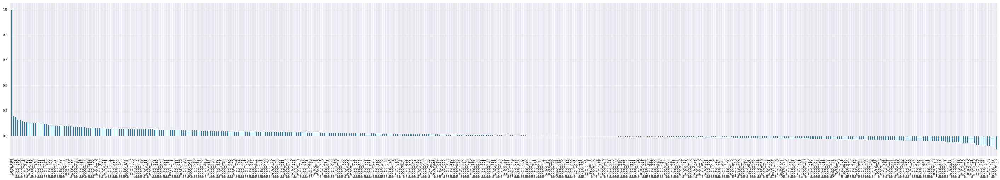

In [21]:
# Lets check how different features are correlated with target 

plt.figure(figsize=(50,8))
df2.corr()['Pass_Fail'].sort_values(ascending = False).plot(kind='bar')

**Not a single feature has great correlation with target attribute**

In [22]:
df2.corr()["Pass_Fail"].sort_values(ascending = False)

Pass_Fail     1.000000
sensor_59     0.156008
sensor_103    0.151230
sensor_510    0.131662
sensor_348    0.130807
sensor_431    0.119936
sensor_434    0.111312
sensor_430    0.109115
sensor_21     0.108333
sensor_435    0.108260
sensor_436    0.106119
sensor_210    0.103348
sensor_129    0.102799
sensor_298    0.101672
sensor_163    0.099506
sensor_124    0.094168
sensor_295    0.091380
sensor_160    0.089233
sensor_164    0.087289
sensor_299    0.087288
sensor_121    0.085084
sensor_300    0.084075
sensor_165    0.083493
sensor_247    0.083231
sensor_294    0.081183
sensor_33     0.080968
sensor_79     0.077723
sensor_159    0.077281
sensor_64     0.076674
sensor_130    0.076592
sensor_519    0.074005
sensor_123    0.072306
sensor_437    0.069366
sensor_114    0.068655
sensor_133    0.067788
sensor_249    0.066478
sensor_387    0.066315
sensor_100    0.065066
sensor_56     0.064267
sensor_95     0.061023
sensor_200    0.060645
sensor_460    0.060625
sensor_63     0.060035
sensor_471 

In [23]:
def trimm_correlated(df_in, threshold):
    df_corr = df_in.corr(method='pearson', min_periods=1)
    df_not_correlated = ~(df_corr.mask(np.tril(np.ones([len(df_corr)]*2, dtype=bool))).abs() > threshold).any()
    un_corr_idx = df_not_correlated.loc[df_not_correlated[df_not_correlated.index] == True].index
    df_out = df_in[un_corr_idx]
    return df_out

In [24]:
df_trim = trimm_correlated(df2, 0.7)
df_trim.head()

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,2853.0,0.9324,0.9479,4.6820,0.8073,10.3092,113.9800,1

In [25]:
df_trim.shape

(1567, 204)

 **Added Time column to "df_trim"** 

In [26]:
df_trim.insert(0, 'Time', df['Time'])
df_trim.head()

,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,2853.0,0

**Seperate time and date into columns**

In [27]:
df_trim['Date'] = df_trim['Time'].apply(lambda x : x[0:-8])
df_trim['Time'] = df_trim['Time'].apply(lambda x : x[-8:])


In [28]:
df_trim.head()

,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail,Date
0,11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1,2008-07-19
1,12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,2853.0,0.9324,

In [29]:
#Moving data to first column
first_column = df_trim.pop('Date')
df_trim.insert(0, 'Date', first_column)
df_trim.head()

,Date,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail
0,2008-07-19,11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1
1,2008-07-19,12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,285

**Check any duplicates after splitting the Time into Data and time**

In [30]:
df_trim.duplicated(
  subset = ['Date', 'Time']).sum()

33

**Observed 33 duplicate Date and Time**

In [31]:
# drop rows which have same Date and Time and keep latest entry
newdf = df_trim.drop_duplicates(
  subset = ['Date', 'Time'],
  keep = 'last').reset_index(drop = True)
newdf.head()


,Date,Time,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail
0,2008-07-19,11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1
1,2008-07-19,12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,285

In [32]:
print(f'Shape before : {df_trim.shape}')

print(f'Shape after removing duplicate time and date : {newdf.shape}')

Shape before : (1567, 206)
Shape after removing duplicate time and date : (1534, 206)


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 3.Data analysis & visualisation:

<AxesSubplot:>

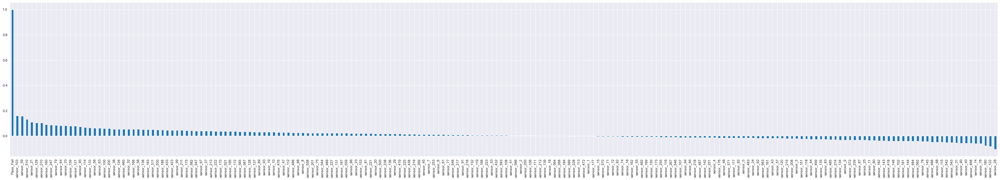

In [33]:
# Lets check how different features are correlated with target 

plt.figure(figsize=(50,8))
newdf.corr()['Pass_Fail'].sort_values(ascending = False).plot(kind='bar')

<AxesSubplot:>

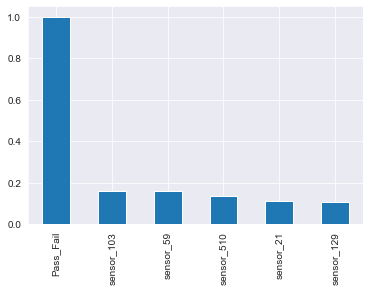

In [34]:
Positive_corr_top5 = newdf.corr()['Pass_Fail'].sort_values(ascending = False)
Positive_corr_top5.head(6).plot(kind='bar')

# Univariate for 
**Top five positively highly correlated features **

<AxesSubplot:title={'center':'sensor_129'}, xlabel='sensor_129', ylabel='Density'>

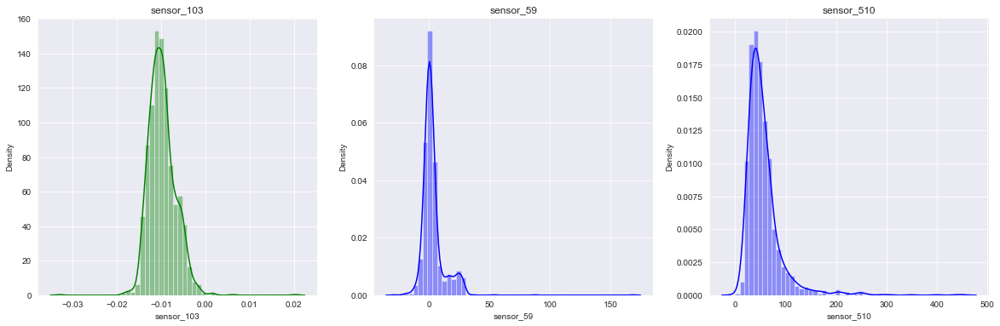

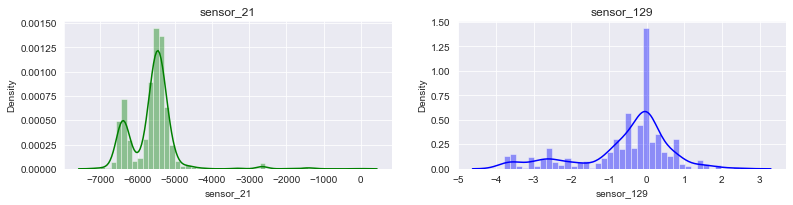

In [35]:
plt.figure(figsize=(20,6))
plt.subplot(1, 3, 1)
plt.title('sensor_103')
sns.distplot(newdf['sensor_103'],color='green')

# subplot 2
plt.subplot(1, 3, 2)
plt.title('sensor_59')
sns.distplot(newdf['sensor_59'],color='blue')

# subplot 3
plt.subplot(1, 3, 3)
plt.title('sensor_510')
sns.distplot(newdf['sensor_510'],color='blue')

plt.figure(figsize=(20,6))
plt.subplot(2, 3, 1)
plt.title('sensor_21')
sns.distplot(newdf['sensor_21'],color='green')

# subplot 2
plt.subplot(2, 3, 2)
plt.title('sensor_129')
sns.distplot(newdf['sensor_129'],color='blue')


<AxesSubplot:>

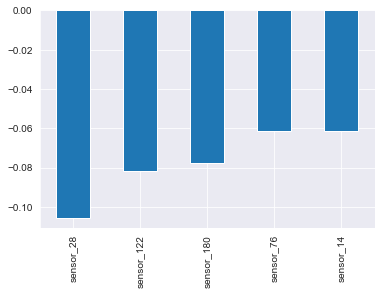

In [36]:
Negative_corr_top5 = newdf.corr()['Pass_Fail'].sort_values(ascending = True)
Negative_corr_top5.head(5).plot(kind='bar')

# Univariate for 
**Top five Negatively highly correlated features **

<AxesSubplot:title={'center':'sensor_14'}, xlabel='sensor_14', ylabel='Density'>

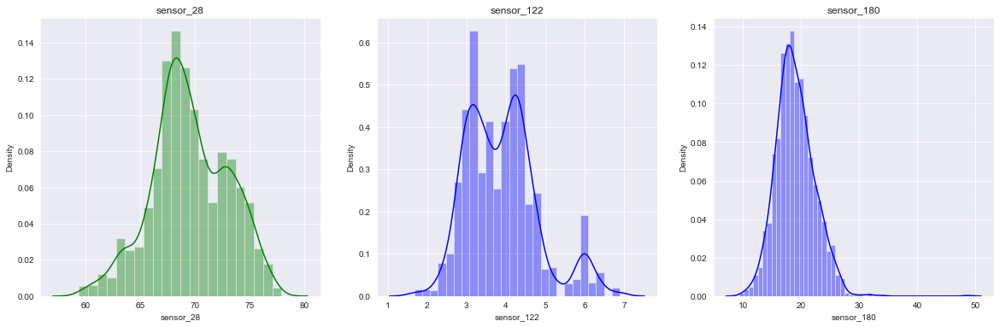

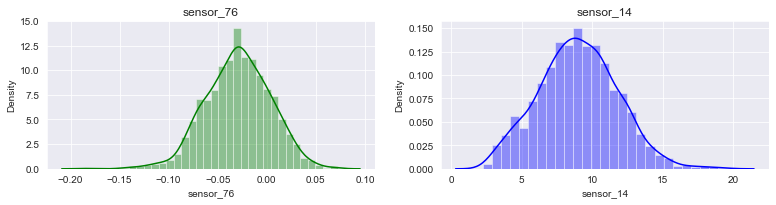

In [37]:
plt.figure(figsize=(20,6))
plt.subplot(1, 3, 1)
plt.title('sensor_28')
sns.distplot(newdf['sensor_28'],color='green')

# subplot 2
plt.subplot(1, 3, 2)
plt.title('sensor_122')
sns.distplot(newdf['sensor_122'],color='blue')

# subplot 3
plt.subplot(1, 3, 3)
plt.title('sensor_180')
sns.distplot(newdf['sensor_180'],color='blue')

plt.figure(figsize=(20,6))
plt.subplot(2, 3, 1)
plt.title('sensor_76')
sns.distplot(newdf['sensor_76'],color='green')

# subplot 2
plt.subplot(2, 3, 2)
plt.title('sensor_14')
sns.distplot(newdf['sensor_14'],color='blue')

**We can observe that most of features are little skewed**

**Top 9 features with target Pass/fail comparison.**

In [112]:
def target_plot(sensor, col1, col2, col3, target = 'Pass_Fail'):
    f,(ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 7.2))
    f.suptitle(f'Distribution for Pass/Fail for {col1.capitalize()}, {col2.capitalize()}, {col3.capitalize()}', 
               fontsize = 14)
    # Distribution for col1
    sns.distplot(sensor[(sensor[target] == -1)][col1], color = 'c', ax = ax1, hist = False, 
                 label = 'Pass').set_title(f'{col1.capitalize()}')
    sns.distplot(sensor[(sensor[target] == 1)][col1], color = 'b', ax = ax1, hist = False, 
                 label = 'Fail').set_title(f'{col1.capitalize()}')
    ax1.legend()
    # Distribution for col2
    sns.distplot(sensor[(sensor[target] == -1)][col2], color = 'c', ax = ax2, hist = False, 
                 label = 'Pass').set_title(f'{col2.capitalize()}')
    sns.distplot(sensor[(sensor[target] == 1)][col2], color = 'b', ax = ax2, hist = False, 
                 label = 'Fail').set_title(f'{col2.capitalize()}')
    ax2.legend()
    # Distribution for col3
    sns.distplot(sensor[(sensor[target] == -1)][col3], color = 'c', ax = ax3, hist = False, 
                 label = 'Pass').set_title(f'{col3.capitalize()}')
    sns.distplot(sensor[(sensor[target] == 1)][col3], color = 'b', ax = ax3, hist = False, 
                 label = 'Fail').set_title(f'{col3.capitalize()}')
    ax3.legend()
    return plt.show()

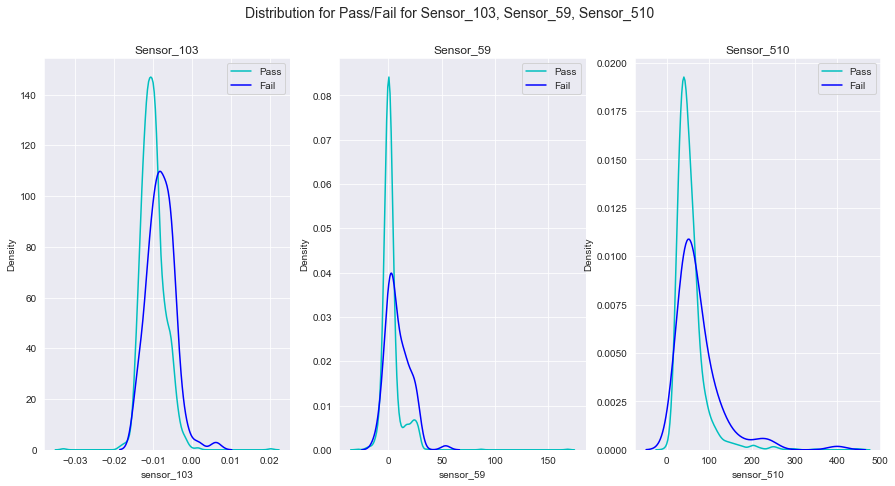

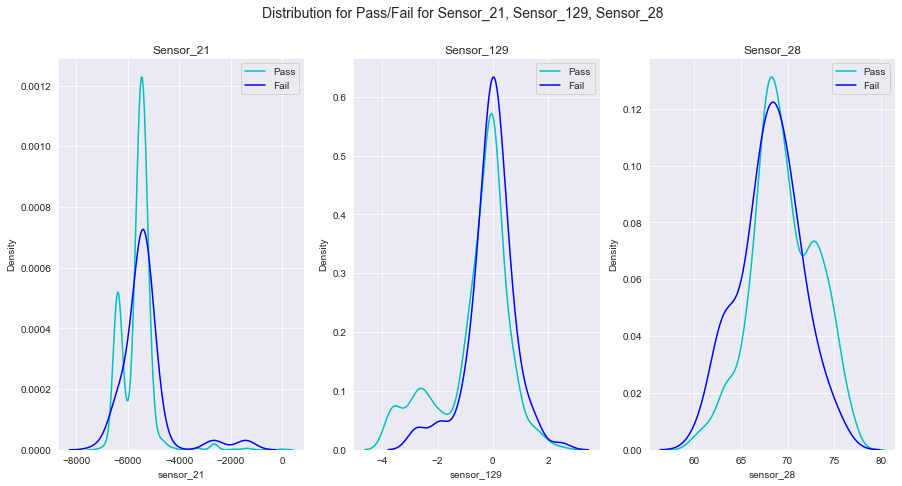

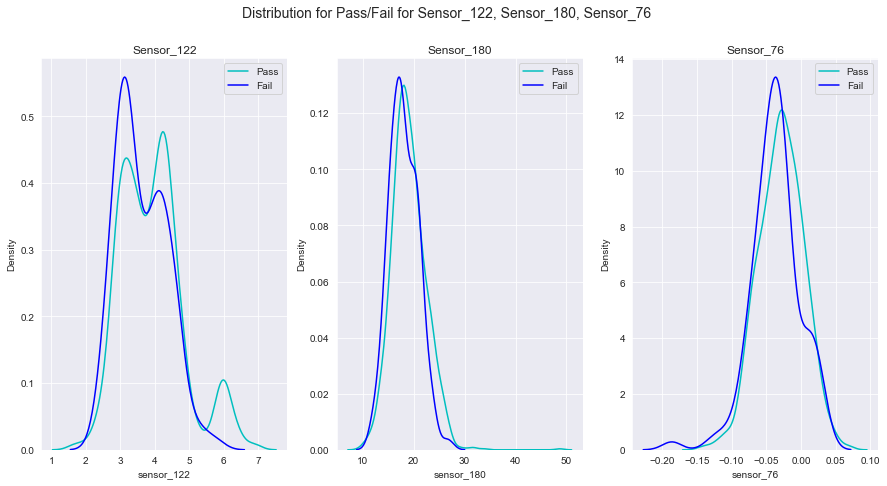

In [114]:
target_plot(newdf, 'sensor_103', 'sensor_59', 'sensor_510')
target_plot(newdf, 'sensor_21', 'sensor_129', 'sensor_28')
target_plot(newdf, 'sensor_122', 'sensor_180', 'sensor_76')


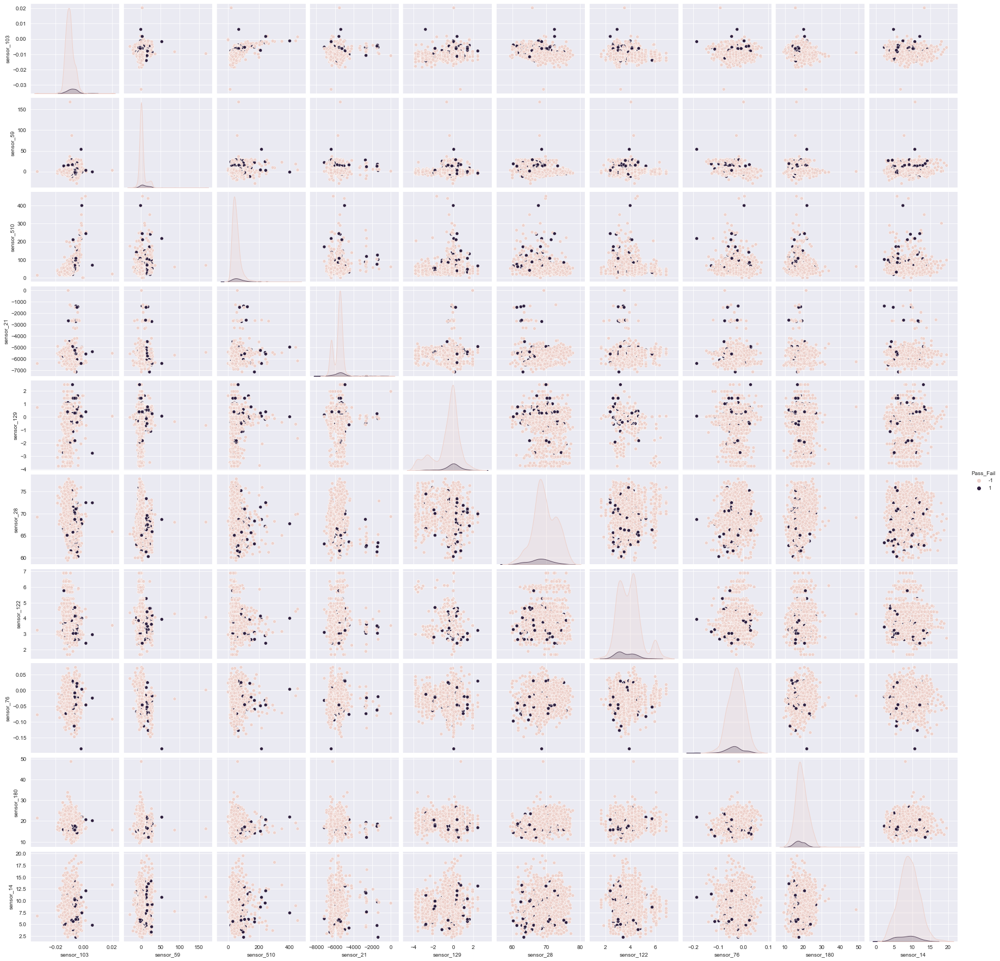

In [38]:
col = ['sensor_103', 'sensor_59', 'sensor_510', 'sensor_21', 'sensor_129','sensor_28', 'sensor_122', 'sensor_76','sensor_180', 'sensor_14','Pass_Fail']

sns.pairplot(newdf[col], hue = 'Pass_Fail');


**Top 10 influenceing features are not correlated with each other.**

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#00b3e5;"> Hypothesis Testing

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">Does each variable has significant effect on target?
 
**we are using One way ANOVA statistical test**
    
 Explanation : The one-way analysis of variance (ANOVA) is used to determine whether there are any statistically significant differences between the means of three or more independent (unrelated) groups. 

In [39]:
col = ['sensor_103', 'sensor_59', 'sensor_510', 'sensor_21', 'sensor_129','sensor_28', 'sensor_122', 'sensor_76','sensor_180', 'sensor_14']
for i in col:
    #print('{} Ho:{} variable has no significant effect on target'.format('\033[1m',i))
    #print('\n')
    #print('{} H1: {} variable has significant effect on target'.format('\033[1m',i))
    print(i)
    df_pass=newdf[newdf.Pass_Fail==-1][i]
    df_fail=df[df.Pass_Fail== 1][i]
    
    f_stats,p_value=stats.f_oneway(df_pass,df_fail )
    print('{} F_stats: {}'.format('\033[92m',f_stats))
    print('{} p_value: {}'.format('\033[92m',p_value))
    if p_value < 0.05:  # Setting our significance level at 5%
        print('{} Rejecting Null Hypothesis.{} variable has significant effect on target '.format('\033[92m',i))
    else:
        print('{} Fail to Reject Null Hypothesis.{} variable has no significant effect on target'.format('\033[92m',i))
    print('\n')

sensor_103
 F_stats: 36.199825911258024
 p_value: 2.2230722090895334e-09
 Rejecting Null Hypothesis.sensor_103 variable has significant effect on target 


sensor_59
 F_stats: 38.900002958526066
 p_value: 5.755952432901636e-10
 Rejecting Null Hypothesis.sensor_59 variable has significant effect on target 


sensor_510
 F_stats: 26.748172797384957
 p_value: 2.623108735032386e-07
 Rejecting Null Hypothesis.sensor_510 variable has significant effect on target 


sensor_21
 F_stats: nan
 p_value: nan
 Fail to Reject Null Hypothesis.sensor_21 variable has no significant effect on target


sensor_129
 F_stats: 17.119961258440625
 p_value: 3.699612821823705e-05
 Rejecting Null Hypothesis.sensor_129 variable has significant effect on target 


sensor_28
 F_stats: nan
 p_value: nan
 Fail to Reject Null Hypothesis.sensor_28 variable has no significant effect on target


sensor_122
 F_stats: 9.4291504542116
 p_value: 0.0021731383631446474
 Rejecting Null Hypothesis.sensor_122 variable has signifi

**Top 10 influencing features have significant effect on target.**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">4.Data pre-processing

**Distribution of target variable**

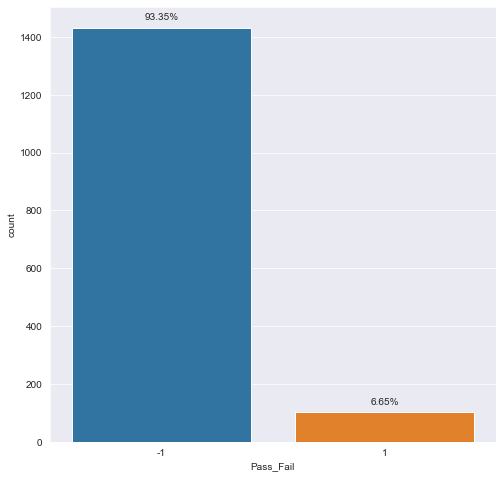

In [40]:
fig, ax = plt.subplots(figsize=(20,8))
width = len(newdf['Pass_Fail'].unique())+6
fig.set_size_inches(width , 8)
ax=sns.countplot(data = newdf, x= 'Pass_Fail') 



for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(newdf)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


**Fail percentage is just 6.65% and pass percentage is 93.35%**

**Imbalance in dataset:**

As we could see, our Target variable is not equally distributed, only 6.65% of signals fails. So, if our model is going to learn from this dataset and do the prediction chances are there that it might be biased towards the Majority class (In this case , signals pass) and ignore the minority class. Hence , we should try to balance our dataset to make our model learn and predict with being biased and treat both classes equally for better result.


**Balancing the Target Variable**

So I am going to balance the target variable with SMOTE (Synthetic Minority Oversampling Technique). With our training data created, I’ll up-sample minority sample( in our case the fail sensors) sample using the SMOTE algorithm. At a high level, SMOTE:

1.Works by creating synthetic samples from the minor class ( fail sensors) instead of creating copies.

2.Randomly choosing one of the k-nearest-neighbors and using it to create a similar, but randomly tweaked, new observations.

In [41]:
newdf = newdf.drop (columns=['Date', 'Time'])
newdf.head()

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589,Pass_Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,0.9455,202.4396,7.9558,414.8710,10.0433,192.3963,12.5190,1.4026,-5419.00,-4043.75,751.00,0.8955,64.2333,2.0222,3.5191,83.3971,9.5126,66.3141,86.9555,61.29,4.515,352.7173,10.1841,130.3691,1.3072,141.2282,4.592,2834.0,0.9317,0.9484,4.7057,-1.7264,10.6231,108.6427,16.1445,21.7264,0.9226,148.6009,84.0793,0.0,0.0126,-0.0206,0.0141,-0.0307,-0.0083,-0.0026,-0.0567,-0.0044,7.2163,0.1320,2.3895,0.9690,1747.6049,0.1841,8671.9301,-0.3274,-0.0055,-0.0001,0.0001,0.0003,-0.0251,0.0002,0.1350,-0.0042,-0.2468,0.3196,0.46285,0.9460,0.0,748.6115,0.9908,58.4306,0.6002,0.9804,6.3788,15.88,2.639,3.353,3.188,-0.0473,0.9960,2.2967,1000.7263,39.2373,123.0,111.3,75.2,46.2000,350.6710,6.78,0.0034,0.0898,0.0850,0.0358,4.271,10.284,0.0167,0.0506,1017.0,967.0,1066.0,368.0,2.0,0.9,0.069,0.046,0.7250,0.1139,0.3183,0.5888,0.9499,0.3979,0.160,20.95,0.333,12.49,16.713,0.0803,65.363,0.292,10.30,5.38,97.314,0.0772,0.0599,0.0700,0.0547,0.0704,0.0520,0.0301,0.1135,3.4789,0.0010,0.0707,0.0211,175.2173,1940.3994,0.0744,0.0546,0.0027,0.0040,0.0270,219.9453,0.0011,0.0189,0.4269,0.0472,40.855,4.5152,525.0965,0.0000,53.6840,26.3617,49.0013,44.5055,29.9394,311.6377,63.7987,31.9893,613.3069,291.4842,494.6996,178.1759,843.1138,0.0000,53.1098,0.0000,0.0000,0.0000,64.6707,0.0000,0.0,0.1096,0.0078,0.0026,1.0616,395.570,75.752,12.93,1.0344,0.4385,264.272,0.6510,5.16,0.11955,533.8500,2.1113,8.95,0.5005,0.0118,0.0205,0.0148,71.9005,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,9.2599,191.2872,12.4608,1.3825,-5441.50,-3498.75,-1640.25,1.2973,68.4222,2.2667,3.4171,84.9052,9.7997,64.9193,87.5241,78.25,2.773,352.2445,10.0373,133.1727,1.2887,145.8445,4.590,2853.0,0.9324,0.9479,4.6820,0.8073,10.3092,113.9800,1

 **Segregate predictors vs target attributes.**

In [42]:
# Arrange data into independent variables and dependent variables
X=newdf.drop(columns='Pass_Fail')
y=newdf['Pass_Fail'] #target
print('Shape of X: {}'.format(X.shape))
print('Shape of y: {}'.format(y.shape))

Shape of X: (1534, 203)
Shape of y: (1534,)


**Standardization (Scaling) for numerical variables**

In [43]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn import model_selection
import warnings
warnings.filterwarnings("ignore")

In [44]:
X_Scaled=X.apply(zscore)
X_Scaled.head()

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255,sensor_267,sensor_268,sensor_269,sensor_418,sensor_419,sensor_423,sensor_432,sensor_433,sensor_438,sensor_460,sensor_468,sensor_472,sensor_476,sensor_482,sensor_483,sensor_484,sensor_485,sensor_486,sensor_487,sensor_488,sensor_489,sensor_499,sensor_500,sensor_510,sensor_511,sensor_521,sensor_542,sensor_543,sensor_544,sensor_546,sensor_547,sensor_548,sensor_550,sensor_558,sensor_559,sensor_562,sensor_563,sensor_564,sensor_565,sensor_570,sensor_571,sensor_572,sensor_582,sensor_583,sensor_586,sensor_587,sensor_589
0,0.227610,0.857050,-0.437764,0.037791,-0.050659,-0.567941,0.266109,0.507083,1.133141,-0.381108,-1.508620,0.760981,-0.374136,0.103042,0.055731,0.846702,0.173818,-0.147236,0.314947,-0.178346,0.370601,-1.730678,-1.521118,-0.843457,-0.285290,-0.953956,0.408154,0.306241,0.267319,-0.289042,0.493444,-0.450038,0.879165,-0.816315,0.688413,0.283184,-0.017046,-0.861029,0.415591,-0.189595,1.323725,-0.489917,0.733674,-0.910803,0.303314,0.235232,-0.051824,0.275939,-0.638181,-0.02554,0.879932,0.264846,0.682785,-0.361819,-0.512467,0.314601,-2.095638,-0.291853,-0.453626,-0.222230,-0.329757,-1.063570,-1.125083,-0.090151,-0.400166,-3.769344,-1.864052,0.145656,0.746550,2.297683,-0.423914,0.620453,2.123327,1.816207,-2.794843,3.809284,0.077245,0.052196,-0.074267,0.018018,0.384788,-0.030710,0.221987,1.065890,0.548789,0.846702,-1.387964,2.362296,-0.018890,0.418932,-0.806676,-0.416329,-0.506785,-0.049593,0.091198,-0.501300,-0.909523,-0.926696,-0.251212,0.039217,-0.604368,-0.492226,0.803820,-0.874750,-0.783554,-0.122568,0.508777,-0.095834,0.134279,0.711215,-0.703921,-0.678468,-0.700440,-0.530999,-1.167796,-1.788888,0.252335,-0.102412,-0.025726,0.125885,1.468902,2.045772,-0.829522,0.585965,-0.952284,0.409619,-1.459159,-0.578090,1.028451,0.009983,-0.833510,-0.478339,0.856208,-0.271202,0.144419,0.604255,-0.106357,-0.223436,-0.957470,-2.088099,0.904591,-0.252579,-1.375866,0.432296,0.253432,1.477146,2.112959,5.201294,3.416822,-1.231047,-0.400046,-0.279850,2.008176,-0.084953,-0.638337,0.193234,-0.794598,2.915574,0.645637,0.725725,-0.950976,-0.737741,-0.582171,-0.693965,-0.299200,0.058073,0.380914,-1.555433,0.791867,1.059546,0.454832,1.325243,-0.102063,1.885072,-0.908434,-1.193085,-1.196816,-0.811391,-0.746669,0.230440,-0.836230,-0.113841,-0.585141,-0.434747,0.310301,0.126631,-1.705135,0.103952,-0.868865,0.467525,0.564368,0.182690,-0.214487,-0.43

**Training Data=70%, Test Data=30%**

In [45]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (1073, 203)
Number transactions y_train dataset:  (1073,)
Number transactions X_test dataset:  (461, 203)
Number transactions y_test dataset:  (461,)


In [46]:

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=0)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {}'.format(y_train_res.shape))

After OverSampling, the shape of train_X: (2008, 203)
After OverSampling, the shape of train_y: (2008,)


Now we have a perfect balanced data!I only **over-sampled on the training data**, because by oversampling only on the training data, **none of the information in the test data is being used to create synthetic observations**, therefore, no information will bleed from test data into the model training.

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#00b3e5;">Check if the train and test data have similar statistical characteristics when compared with original data

**To check similar charecteristics, we will consider one sample from train data and another similar sample from test and compare them separetly with population of Original data.** 

To do this we will do hypopthesis testing using one sample Z-Test.

**z  tests** are a statistical way of testing a hypothesis when either:

We know the population variance, or
We do not know the population variance but our sample size is large n ≥ 30

We perform the **One-Sample Z test** when we want to compare a sample mean with the population mean.

SE = Sd/np.sqrt(N)
z_stat = (x_bar - mu)/SE

where,
X¯: mean of the sample.

mu: mean of the population.

Sd: Standard deviation of the population.

n: sample size.

**Lets consider top 10 influencing features as a sample to check similar charecteristics**

Train data is having similar charecteristics with Original data

* H<sub>0</sub>: The sample from train comes from the original  population, x_bar = &mu;.
* H<sub>A</sub>: The sample from train  not comes from the original population, x_bar != (not equal) &mu;.

In [47]:
col = ['sensor_103', 'sensor_59', 'sensor_510', 'sensor_21', 'sensor_129','sensor_28', 'sensor_122', 'sensor_76','sensor_180', 'sensor_14']

for sam in col:
# Population from Original data
    Original = X[sam]
    mu = Original.mean()
    sigma = Original.std(ddof=0)
    #print("mu: ", mu, ", sigma:", sigma)
#Sample from Train data 
    train = X_train[sam]
    X_bar = train.mean()
    n= X_train[sam].size
   # print("X_Bar: ", X_bar, ", n:", n)
    z_critical = 1.96 # alpha level of 0.05 and two-tailed test
    SE = sigma/np.sqrt(n)
    z_stat = (X_bar - mu)/SE
   # print(z_stat)
    if z_stat < z_critical:
        print('{} Fail to reject Null Hypothesis. Train sample of {} comes from original population'.format('\033[92m',sam))
    else:
        print('{} Rejecting Null Hypothesis. Train sample of {} does not comes from original population'.format('\033[50m',sam))

 Fail to reject Null Hypothesis. Train sample of sensor_103 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_59 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_510 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_21 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_129 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_28 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_122 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_76 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_180 comes from original population
 Fail to reject Null Hypothesis. Train sample of sensor_14 comes from original population


**Observation :** 

    Train data have similar charesteristics has z_stat is less than z critical

Test data is having similar charecteristics with Original data

* H<sub>0</sub>: The sample from test comes from the original  population, x_bar = &mu;.
* H<sub>A</sub>: The sample from test  not comes from the original population, x_bar != (not equal) &mu;.

In [48]:
col = ['sensor_103', 'sensor_59', 'sensor_510', 'sensor_21', 'sensor_129','sensor_28', 'sensor_122', 'sensor_76','sensor_180', 'sensor_14']

for sam_test in col:
# Population from Original data
    Original = X[sam_test]
    mu = Original.mean()
    sigma = Original.std(ddof=0)
    #print("mu: ", mu, ", sigma:", sigma)
#Sample from Test data 
    test = X_test[sam_test]
    X_bar = test.mean()
    n= X_test[sam_test].size
   # print("X_Bar: ", X_bar, ", n:", n)
    z_critical = 1.96 # alpha level of 0.05 and two-tailed test
    SE = sigma/np.sqrt(n)
    z_stat = (X_bar - mu)/SE
   # print(z_stat)
    if z_stat < z_critical:
        print('{} Fail to reject Null Hypothesis. Test sample of {} comes from original population'.format('\033[92m',sam_test))
    else:
        print('{} Rejecting Null Hypothesis. Test sample of {} does not comes from original population'.format('\033[50m',sam_test))

 Fail to reject Null Hypothesis. Test sample of sensor_103 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_59 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_510 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_21 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_129 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_28 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_122 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_76 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_180 comes from original population
 Fail to reject Null Hypothesis. Test sample of sensor_14 comes from original population


**Observation :** 

    Test data have similar charesteristics has z_stat is less than z critical

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">5.Model training, testing and tuning

In [49]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
#!pip install catboost
from catboost import CatBoostClassifier
#!pip install xgboost
from xgboost import XGBClassifier
#!pip install lightgbm
from lightgbm import LGBMClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV,StratifiedKFold
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,ConfusionMatrixDisplay,precision_score,recall_score,f1_score,classification_report,roc_curve,plot_roc_curve,auc,precision_recall_curve,plot_precision_recall_curve,average_precision_score
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import LeaveOneOut

In [50]:
models = []
models.append(['RidgeClassifier',RidgeClassifier()])
models.append(['Logistic Regression',LogisticRegression(random_state=0)])
models.append(['SVM',SVC(random_state=0)])
models.append(['KNeigbors',KNeighborsClassifier()])
models.append(['GaussianNB',GaussianNB()])
models.append(['BernoulliNB',BernoulliNB()])
models.append(['DecisionTree',DecisionTreeClassifier(random_state=0)])
models.append(['XGBClassifier',XGBClassifier(learning_rate=0.1,objective='binary:logistic',random_state=0,eval_metric='mlogloss')])
models.append(['RandomForest',RandomForestClassifier(random_state=0)])
models.append(['AdaBoostClassifier',AdaBoostClassifier()])
models.append(['GBClassifier',GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=0)])
#models.append(['LGBMClassifier',LGBMClassifier(random_state=0)])
models.append(['CatBoostClassifier',CatBoostClassifier(learning_rate=0.1,loss_function= 'Logloss', eval_metric='AUC',random_state=0)])
models.append(['BaggingClassifier', BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=0)])


**Each model outcome is stored in the "lst_2" to prepare the table.** 
- Below we have used two cross validation methods are K-Fold Validation and SK fold vaidation
- We have ignored Leave one out cross-validation as its taking lot of run time

In [51]:
lst_1 = []
for m in range(len(models)):
    lst_2 = []
    model = models[m][1]
    model.fit(X_train_res,y_train_res)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train_res)
    cm = confusion_matrix(y_test,y_pred)
# k-fOLD Validation   
    Kfold_CV = cross_val_score(estimator= model, X = X_train_res,y = y_train_res, cv=10)
# Sk-fOLD Validation
    skfold = StratifiedKFold(n_splits=5)
    sKfold_CV = cross_val_score(estimator= model, X = X_train_res,y = y_train_res, cv=skfold) 

    roc = roc_auc_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred,pos_label=-1)
    recall = recall_score(y_test,y_pred,pos_label=-1)
    f1 = f1_score(y_test,y_pred,pos_label=-1)
    print(models[m][0],':')
    print(cm)
    print('')
    print('')
    print(classification_report(y_test, y_pred)) 
    print('-'*40)
    print('')
    lst_2.append(models[m][0])
    lst_2.append(accuracy_score(y_train_res,y_train_pred)*100)
    lst_2.append(accuracy_score(y_test,y_pred)*100)
    lst_2.append(Kfold_CV.mean()*100)
    lst_2.append(sKfold_CV.mean()*100)
    lst_2.append(roc)
    lst_2.append(precision)
    lst_2.append(recall)
    lst_2.append(f1)
    lst_1.append(lst_2)

RidgeClassifier :
[[345  83]
 [ 17  16]]


              precision    recall  f1-score   support

          -1       0.95      0.81      0.87       428
           1       0.16      0.48      0.24        33

    accuracy                           0.78       461
   macro avg       0.56      0.65      0.56       461
weighted avg       0.90      0.78      0.83       461

----------------------------------------

Logistic Regression :
[[304 124]
 [ 17  16]]


              precision    recall  f1-score   support

          -1       0.95      0.71      0.81       428
           1       0.11      0.48      0.18        33

    accuracy                           0.69       461
   macro avg       0.53      0.60      0.50       461
weighted avg       0.89      0.69      0.77       461

----------------------------------------

SVM :
[[259 169]
 [ 20  13]]


              precision    recall  f1-score   support

          -1       0.93      0.61      0.73       428
           1       0.07      0.3

**All model results**

In [52]:
model_result = pd.DataFrame(lst_1,columns=['Model','Train_Accuracy','Test_Accuracy','K-Fold Mean Accuracy','SK-Fold Mean Accuracy','ROC_AUC','Precision','Recall','F1 Score'])

model_result.sort_values(by=['F1 Score','Recall'],inplace=True,ascending=False)
model_result

,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
7,XGBClassifier,100.000000,92.841649,98.357711,98.507090,0.541950,0.934066,0.992991,0.962627
11,CatBoostClassifier,100.000000,92.624729,98.656468,98.457091,0.526798,0.932018,0.992991,0.961538
8,RandomForest,100.000000,92.407809,99.552239,99.402613,0.497664,0.928105,0.995327,0.960541
12,BaggingClassifier,99.950199,91.540130,97.013184,97.261697,0.534941,0.933185,0.978972,0.955530
10,GBClassifier,99.302789,90.238612,96.515423,96.814183,0.611831,0.944316,0.950935,0.947614
9,AdaBoostClassifier,97.609562,87.635575,93.079851,92.681232,0.611796,0.944844,0.920561,0.932544
6,DecisionTree,100.000000,83.731020,88.497015,88.746914,0.562801,0.937965,0.883178,0.909747
5,BernoulliNB,84.511952,79.175705,84.216418,84.365579,0.636151,0.951087,0.817757,0.879397
0,RidgeClassifier,91.484064,78.308026,89.045274,88.397290,0.645462,0.953039,0.806075,0.873418
1,Logistic Regression,72.260956,69.414317,70.468408,69.970472,0.597564,0.947040,0.710280,0.811749


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Best Model
    
**RandomForest,XGBClassifier and CatBoostClassifier** are considerd as best model.Because,

   Test Accuracy, Precision, recall and F1score are almost very near for all three models.
    
    
    - We can observe little overfitting in these three models as training and test accuracies are different. But if we     K-fold and SK fold CV's can give confidenc about choosing best models. 


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Tuning
    
**Hyperparameter tuning for RandomForest,XGBClassifier and CatBoostClassifier using Gridsearch.**

In [53]:
gb_clf = XGBClassifier(random_state=0)
CatB_clf= CatBoostClassifier(random_state=0)
rf = RandomForestClassifier(random_state=0)
model_clf = [gb_clf,CatB_clf,rf ]
skfold = StratifiedKFold(n_splits=5)
Param_3 = {
              'n_estimators' : [5, 10, 15, 20, 25, 50, 100],
              'min_samples_split':[5, 7,10],
              'max_depth': [3, 5, 7, 9],
              'max_features': [10, 12, 17],
              'min_samples_leaf': [4, 6, 8],
              'criterion' :['gini', 'entropy']}
Param_1 ={ 
           'learning_rate' : [0.01, 0.05, 0.1],
           'n_estimators' : [5, 10, 15, 20, 25, 50, 100],
           'max_depth' :[3, 5, 7, 9],
           'min_child_weight' :[1],
           'gamma' :[0],
           'subsample':[0.8],
           'colsample_bytree':[0.8],
           'objective' : ['binary:logistic'],
           'nthread' : [4],
           'scale_pos_weight': [1]}
Param_2 = {'depth': [3, 5, 7, 9],
          'learning_rate' : [0.01, 0.05, 0.1],
         'l2_leaf_reg': [4],
         'iterations': [100]}
parameters_list=[Param_1, Param_2, Param_3]
    
for i in range(len(model_clf)):
    
    grid_clf = GridSearchCV(estimator=model_clf[i], param_grid=parameters_list[i], cv=skfold, scoring="accuracy", n_jobs= -1, verbose = 1)
    grid_clf.fit(X_train_res,y_train_res)
    print(model_clf[i])
    print("Best Params are :",grid_clf.best_params_)
    print('-'*40)

Fitting 5 folds for each of 84 candidates, totalling 420 fits
[17:18:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              random_state=0, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=None, tree_method=None,
              validate_parameters=None, verbosity=None)

**Fitting Best three models with their best parameters.**

In [56]:
Best_Models = []
Best_Models.append(['XGBClassifier',XGBClassifier(colsample_bytree = 0.8, gamma =  0, learning_rate= 0.05,max_depth=7, min_child_weight =1, n_estimators = 100, nthread = 4, objective = 'binary:logistic', scale_pos_weight = 1, subsample = 0.8,random_state=0)])
Best_Models.append(['CatBoostClassifier',CatBoostClassifier(depth= 9,iterations =100, l2_leaf_reg=4,learning_rate=0.05,random_state=0)])
Best_Models.append(['RandomForest',RandomForestClassifier(criterion ='gini', max_depth=9,max_features=12, min_samples_split=10,n_estimators=100,random_state=0,min_samples_leaf=4)])

In [57]:
List1 = []
for m in range(len(Best_Models)):
    List_2 = []
    model = Best_Models[m][1]
    model.fit(X_train_res,y_train_res)
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train_res)
    cm = confusion_matrix(y_test,y_pred)
# k-fOLD Validation   
    Kfold_CV = cross_val_score(estimator= model, X = X_train_res,y = y_train_res, cv=10)
# Sk-fOLD Validation
    skfold = StratifiedKFold(n_splits=5)
    sKfold_CV = cross_val_score(estimator= model, X = X_train_res,y = y_train_res, cv=skfold) 

    roc = roc_auc_score(y_test,y_pred,labels=-1)
    precision = precision_score(y_test,y_pred,pos_label=-1)
    recall = recall_score(y_test,y_pred,pos_label=-1)
    f1 = f1_score(y_test,y_pred,pos_label=-1)
    print(Best_Models[m][0],':')
    print(cm)
    print('')
    print('')
    print(classification_report(y_test, y_pred)) 
    print('-'*40)
    print('')
    List_2.append(Best_Models[m][0])
    List_2.append(accuracy_score(y_train_res,y_train_pred)*100)
    List_2.append(accuracy_score(y_test,y_pred)*100)
    List_2.append(Kfold_CV.mean()*100)
    List_2.append(sKfold_CV.mean()*100)
    List_2.append(roc)
    List_2.append(precision)
    List_2.append(recall)
    List_2.append(f1)
    List1.append(List_2)

[17:50:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:50:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:50:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:50:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [58]:
Best_result = pd.DataFrame(List1,columns=['Model','Train_Accuracy','Test_Accuracy','K-Fold Mean Accuracy','SK-Fold Mean Accuracy','ROC_AUC','Precision','Recall','F1 Score'])

Best_result.sort_values(by=['F1 Score','Recall'],inplace=True,ascending=False)
Best_result

,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
1,CatBoostClassifier,100.000000,93.275488,98.207214,98.456471,0.614203,0.944072,0.985981,0.964571
0,XGBClassifier,100.000000,92.624729,98.506965,98.755847,0.554765,0.935841,0.988318,0.961364
2,RandomForest,99.850598,92.624729,98.357463,98.655724,0.582732,0.939732,0.983645,0.961187


# Doing PCA

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Dimensional reduction: perform dimensional reduction on the data

#### Principal Component Analysis :
It is the most popular feature extraction technique.

It creates new variables using linear combinations of old variables and creates variables that are independent of one another.

It manages to tell us how important each of these new variables are and helps in choosing how many variables we can use to get desired accuracy.

Main idea of using PCA is to seek most accurate data representation in lower dimension space and it removes the noise and explore the hidden pattern within the data.

Step by step implementation of PCA is explained below.

#### Step-1: Normalize the data variables between (-1,1).
This is already done above, so we can directly used the scaled data.

#### Step 2: Covariance matrix : It is to describe the correlation between variables in the dataset.
It is the direction of linear relationship between variables.

In [59]:
covMatrix = np.cov(X_Scaled,rowvar=False)
pd.DataFrame(covMatrix)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202
0,1.000652,-0.153117,0.007503,-0.002864,-0.010795,0.001831,0.031243,-0.057117,0.012506,0.006970,0.043902,0.006672,-0.008729,0.032177,-0.004934,0.012826,-0.008978,0.026581,-0.012202,-0.044924,-0.017821,0.107612,0.052522,-0.027927,-0.055454,-0.004615,-0.033414,-0.040128,-0.042597,-0.005008,0.041149,-0.051373,0.057523,0.009842,-0.037119,0.005811,0.010983,-0.023981,0.014771,-0.024365,-0.007700,-0.103087,0.036433,0.005483,-0.046199,-0.023085,-0.023243,0.030705,0.001686,-0.029693,0.084954,0.033312,0.017953,0.077222,-0.124908,0.015225,0.045292,0.039430,0.006404,0.061847,-0.018896,0.044962,-0.032610,-0.012182,0.016940,0.015713,-0.013539,0.002951,-0.007932,-0.046128,-0.063114,0.032847,-0.051576,-0.074556,-0.013447,-0.025927,-0.028124,0.017365,-0.007218,0.025070,0.056594,-0.001030,-0.012395,-0.013764,-0.000735,-0.011746,0.000577,-0.022559,-0.048753,-0.074545,0.028637,0.030948,-0.004877,0.011839,-0.074053,0.152295,0.156099,-0.025737,0.001331,-0.007158,-0.003465,0.023690,-0.026255,-0.029566,0.003385,-0.014276,-0.030400,0.042850,-0.038025,-0.006582,0.009657,0.063522,0.001452,0.027831,0.015894,0.046652,-0.001836,-0.020624,0.008663,0.038141,0.030927,-0.012972,-0.045210,0.002953,0.004872,0.036234,-0.023159,0.006386,-0.046982,0.021395,-0.030818,0.000939,-0.041949,-0.002985,-0.031239,-0.027545,-0.027341,0.026010,-0.013520,0.061035,-0.023423,-0.011788,-0.072042,-0.006301,-0.013494,-0.001820,-0.012671,-0.011525,-0.009268,-0.026756,-0.010005,-0.056548,0.008665,0.001988,-0.012228,-0.086898,0.088892,-0.027655,0.038837,-0.001074,0.011668,0.025650,-0.006740,0.062779,0.023812,0.008018,0.055488,0.013355,-0.019791,-0.011365,0.048259,-0.017246,-0.023233,-0.034340,0.077250,0.061471,-0.029087,-0.050150,-0.019974,-0.062006,-0.014759,0.014781,0.085522,-0.004472,-0.055150,0.026375,0.026609,-0.093337,-0.076497,0.034172,0.044264,-0.006963,-0.010593,0.059312,0.041787,-0.016799,-0.022850,0.005196,-0.002413,0.024813,0.020950,-0.031594,-0.001386
1,-0.153117,1.000652,0.010351,-0.011603,-0.001699,-0.019877,-0.012870,0.027506,0.020809,0.005980,-0.025161,0.038093,-0.032812,-0.085695,-0.003839,0.049789,-0.003220,0.028699,0.060980,-0.015058,-0.068242,0.003524,-0.022403,0.007183,-0.051414,-0.044246,-0.021003,-0.011810,0.013260,0.026427,-0.019994,-0.012100,0.000578,0.023202,0.013669,0.004864,-0.030424,0.023653,-0.003552,0.031303,-0.023346,0.008235,0.009439,-0.011420,0.037965,0.062778,0.002916,0.020815,-0.019766,0.002994,-0.053833,-0.050368,-0.021253,0.012005,0.008937,0.012968,0.016726,0.017059,-0.009728,0.053453,0.019352,-0.038817,-0.009789,0.014802,0.016003,0.023459,-0.014618,-0.024715,-0.007260,0.035789,0.018118,0.000689,-0.032315,0.029303,0.009214,-0.025805,0.004645,0.049970,0.019157,0.031951,-0.012624,-0.008879,0.001383,0.020023,-0.011094,0.005103,-0.020727,0.031511,0.016277,-0.009381,-0.024327,-0.005310,-0.031604,0.032881,0.048305,-0.036198,-0.120832,-0.029459,-0.002499,0.023316,0.005977,0.031545,0.026413,0.007216,-0.043283,-0.098682,0.058740,0.001739,0.037285,0.033786,0.030810,-0.010395,-0.032236,-0.002329,-0.002888,0.009993,0.023537,0.000460,0.002970,0.058419,0.041768,-0.015040,0.005620,-0.032820,-0.032691,0.000373,-0.008598,0.014662,0.058013,0.038903,-0.001844,0.001163,-0.062408,-0.008417,0.003614,0.035665,0.037662,-0.061753,-0.020819,-0.021342,0.005818,-0.012238,0.024732,-0.0

#### Step 3: Eigen vectors : 
These are the principal components and the corresponding eigen values which are the magnitudes of variance captured.

The eigenvectors are nothing but the principal components of our above covariance matrix and represent the axis of new feature space whereas eigenvalues are the magnitude of those vectors.

In [60]:
from sklearn import metrics
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X_Scaled)

PCA()

In [61]:
# Eignen values
pca.explained_variance_

array([7.79891097e+00, 4.80951259e+00, 3.93627133e+00, 3.69097477e+00,
       3.44476078e+00, 3.18147396e+00, 3.07489587e+00, 2.84893331e+00,
       2.64354971e+00, 2.62050012e+00, 2.51182789e+00, 2.42019795e+00,
       2.35145593e+00, 2.29902775e+00, 2.20867419e+00, 2.16179833e+00,
       2.12449131e+00, 2.11112630e+00, 2.07474564e+00, 2.04595953e+00,
       2.01291051e+00, 1.97753128e+00, 1.92525104e+00, 1.91536165e+00,
       1.90173467e+00, 1.86991394e+00, 1.85658948e+00, 1.80838029e+00,
       1.78570219e+00, 1.74455096e+00, 1.73825000e+00, 1.70400308e+00,
       1.68442273e+00, 1.66339978e+00, 1.65799083e+00, 1.62828891e+00,
       1.61564262e+00, 1.59775296e+00, 1.55121751e+00, 1.53990479e+00,
       1.53430569e+00, 1.50905765e+00, 1.47705459e+00, 1.46527142e+00,
       1.44065468e+00, 1.41495972e+00, 1.39324379e+00, 1.38638021e+00,
       1.37179310e+00, 1.36282079e+00, 1.32701384e+00, 1.31867747e+00,
       1.30635770e+00, 1.27524742e+00, 1.26391208e+00, 1.24203553e+00,
      

In [62]:
# Eigen Vectors
pd.DataFrame(pca.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202
0,-0.050572,0.006870,0.011017,-0.079725,-0.025578,0.093145,0.022076,0.075503,-0.033157,0.022272,-0.105023,0.027432,0.006287,0.002683,0.027150,0.008695,0.006906,-0.050197,-0.059746,0.021380,0.060936,-0.213373,-0.225942,0.141440,0.182780,0.038633,0.046007,0.045515,0.128450,-0.059486,0.036293,0.040137,-0.074330,-0.048712,-0.005151,0.012934,0.051089,0.045210,0.071657,0.036772,0.077668,0.174430,-0.001704,-0.027729,0.085799,0.017697,0.046885,-0.062734,-0.117140,-0.015675,-0.075940,-0.101099,0.022581,-0.226807,0.187643,-0.092340,-5.122636e-03,-0.041344,-0.079014,0.001540,-0.025087,-0.032268,0.016272,0.010933,-0.018635,-0.018428,0.041557,0.024732,-0.013951,0.065470,-0.001749,-0.010030,0.030783,0.178505,-0.005991,-0.000226,0.033382,-0.059996,0.014860,-0.019088,-0.017316,-0.006813,-0.009773,-0.009210,0.012918,0.066988,-0.070264,-0.007503,0.013201,0.154832,-0.006350,0.116868,0.045440,-0.021438,0.006359,-0.000091,0.007365,0.067102,-0.114056,-0.038260,0.049247,-0.076773,0.019925,0.036934,0.023479,-0.010453,0.075108,0.005189,0.067623,0.110263,0.009834,-0.131917,-0.046657,-0.133672,-0.129542,-0.218407,0.079959,-5.524274e-02,0.021654,-0.040013,-0.030854,0.003773,0.075930,-0.111709,-0.026650,-0.035081,0.048737,-0.017411,0.009822,0.012971,0.015827,-0.055464,0.077055,0.066184,2.385935e-02,0.032801,0.078536,0.025331,-0.017934,0.000692,-0.002594,0.035575,0.001668,0.024534,0.022064,-0.044861,0.018040,0.056876,0.046891,0.026868,-0.029584,0.115391,-0.006084,0.029798,0.011500,0.125707,-0.099122,0.025437,-0.023368,-0.024932,-0.001051,0.019183,0.004345,-0.101581,-0.138965,0.004803,-0.099023,-0.056791,0.106353,0.004526,-0.065238,0.078566,-0.028360,-0.002087,-0.084553,0.015110,-0.006417,-0.010748,0.003327,0.137155,0.013770,0.001925,-0.186822,-0.134289,0.087614,0.044249,0.087045,0.136248,0.051210,-0.017081,-0.000749,-0.040490,0.035271,-0.039716,-0.021426,-0.008801,0.102820,-0.021226,0.013445,0.005572,-0.051403,0.020809,0.032068
1,-0.015684,-0.013317,-0.007124,-0.043247,0.018493,0.048021,-0.024958,0.004637,-0.011679,-0.016153,-0.007126,-0.002196,0.059396,0.016963,0.038128,-0.036204,-0.016252,-0.063249,-0.109101,-0.004717,0.047028,-0.020400,0.000045,0.032816,0.105853,0.027385,0.017570,0.031180,-0.102012,0.017293,-0.012581,0.025905,-0.230692,0.290859,-0.179964,-0.274774,0.002239,-0.047467,-0.101396,-0.020767,-0.216299,-0.017032,-0.277072,0.319121,-0.069205,0.004671,0.099136,-0.188297,-0.006406,0.038341,0.056364,-0.032530,-0.046552,-0.065381,-0.037053,-0.023682,-5.375418e-02,-0.038400,-0.007414,-0.000055,0.015578,0.020523,-0.027816,-0.015975,-0.015749,-0.029383,0.048104,0.027213,0.038398,-0.042951,-0.000543,0.009899,0.000241,-0.059420,-0.051477,-0.036864,0.029228,0.017208,-0.021315,-0.002112,-0.013191,-0.014330,0.009704,0.007753,-0.028526,0.084136,0.028132,-0.075638,-0.079918,0.042643,-0.017208,-0.167521,-0.038498,0.020298,0.024264,-0.014441,-0.028570,-0.034304,-0.031902,0.008191,-0.032226,0.079335,0.039547,0.027294,-0.053438,0.012094,0.019835,0.015864,-0.079143,-0.061232,-0.001678,-0.048694,-0.011863,-0.047342,-0.054139,-0.025990,-0.057212,5.527370e-02,0.023729,0.022877,-0.118849,0.012330,-0.030708,0.078495,0.090692,0.116419,0.105362,-0.027612,-0.102252,-0.053366,0.092459,0.105312,0.051713,-0.016519,4.435501e-03,-0.013179,0.030016,0.014311,0.053825,-0.026829,0.064076,0.

In [63]:
k = 1
total = []
for i in pca.explained_variance_ratio_*100:
    print('Variance explained by Principle Component',k,'is : {:.2f}%'.format(i))
    k+=1
    #print(i)
    total.append(i)
    if sum(total) > 95:
         print("Number of principle components enough")  
print('\nTotal variance explained by all the principle components:',sum(total),'%')

Variance explained by Principle Component 1 is : 3.84%
Variance explained by Principle Component 2 is : 2.37%
Variance explained by Principle Component 3 is : 1.94%
Variance explained by Principle Component 4 is : 1.82%
Variance explained by Principle Component 5 is : 1.70%
Variance explained by Principle Component 6 is : 1.57%
Variance explained by Principle Component 7 is : 1.51%
Variance explained by Principle Component 8 is : 1.40%
Variance explained by Principle Component 9 is : 1.30%
Variance explained by Principle Component 10 is : 1.29%
Variance explained by Principle Component 11 is : 1.24%
Variance explained by Principle Component 12 is : 1.19%
Variance explained by Principle Component 13 is : 1.16%
Variance explained by Principle Component 14 is : 1.13%
Variance explained by Principle Component 15 is : 1.09%
Variance explained by Principle Component 16 is : 1.06%
Variance explained by Principle Component 17 is : 1.05%
Variance explained by Principle Component 18 is : 1.04%
V

#### We will proceed with 156 components here as it explains 95% of the variance
With only 156 variables/PC's we can explain over 95% of the variation in the original data.

#### Step 5: Finally Original Data can be projected using principal components in reduced dimensions.

In [64]:
pca2 = PCA(n_components=156)
pca2.fit(X_Scaled)

PCA(n_components=156)

In [65]:
# Eigen Vectors (transformed into 156 dimensions)
pd.DataFrame(pca2.components_).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155
0,-0.050572,-0.015684,-0.031212,-0.016995,-0.011538,0.000981,0.027485,-0.017640,0.008860,0.000997,0.019898,-0.004635,0.060761,-0.039798,-0.073368,-0.100085,-0.026341,0.083620,-0.068822,0.008818,-0.081432,0.089742,-0.081897,-0.042006,0.074996,-0.077979,-0.145113,0.000542,-0.002353,-0.027254,0.088128,-0.176179,-0.034943,-0.050771,-0.018746,0.022768,0.018720,-0.010569,0.000328,0.007388,0.055531,-0.014206,-0.055993,0.052632,0.013606,0.005317,0.017779,0.123343,-0.101712,-0.078369,-0.018188,0.005820,-0.000328,0.036138,0.045017,0.053730,-0.135846,0.066973,-0.193559,-0.045830,-0.015109,0.028702,-0.053722,-0.167678,-0.025763,0.005938,0.149058,-0.045930,-0.109748,0.078368,0.019164,-0.022328,0.081798,0.037803,0.092228,0.005082,-0.081068,0.102465,0.034524,0.068515,-0.095440,0.049112,0.175574,-0.171780,-0.190004,-0.130358,-0.033983,-0.064682,-0.229000,-0.139492,0.131793,0.122477,-0.020094,0.039979,-0.055347,-0.065527,-0.076924,0.013947,-0.008172,0.021215,0.047971,0.034092,0.079360,-0.124228,0.094938,-0.034751,0.056782,0.162871,0.116985,0.034307,-0.061246,0.083993,0.056207,0.043374,-0.130809,-0.103382,0.022664,0.090157,-0.197536,-0.021784,-0.031406,-0.042978,0.163847,0.009414,-0.103575,0.056340,-0.135992,-0.068372,-0.112360,-0.100113,0.064058,0.016774,0.077120,0.102075,0.112603,-0.020378,0.081394,0.096871,0.017781,0.001507,-0.039574,-0.067096,0.109540,-0.015164,-0.013519,0.013041,-0.000611,-0.022684,-0.022622,-0.038943,0.010532,-0.006713,-0.009954,0.019365,0.003833,-0.089588
1,0.006870,-0.013317,0.032412,0.010453,-0.015610,0.012617,-0.048776,0.045949,-0.004661,-0.033826,-0.055828,-0.071944,-0.019563,0.049602,0.068271,0.044226,-0.000311,-0.020156,-0.077729,0.000585,-0.006735,-0.079382,0.037858,0.015463,-0.136929,0.071584,0.104694,-0.084639,-0.064008,-0.036919,-0.028940,0.116171,0.043169,0.073018,-0.033427,0.016526,0.017293,0.046335,-0.051199,-0.108111,-0.033668,-0.036459,-0.015840,0.027847,0.059346,-0.132607,-0.057431,-0.098947,0.019868,0.058054,0.015206,-0.056167,0.040636,-0.044515,0.054019,0.047457,0.097635,-0.031444,0.180578,-0.032603,-0.145797,0.141473,0.025783,0.230285,-0.018489,0.040668,0.102754,-0.015669,-0.045905,-0.052647,0.175805,-0.053690,-0.055529,0.058514,-0.076145,0.073006,0.008476,0.088473,-0.154724,0.121699,0.014979,0.051407,0.130910,-0.112506,0.097379,0.066950,-0.111828,-0.107032,-0.022131,-0.093688,0.059386,-0.050958,-0.054112,-0.153867,0.041519,0.032599,-0.146864,0.229209,-0.281625,-0.091066,-0.055758,0.007574,-0.023561,0.054786,0.088137,0.019883,0.075003,-0.009060,0.087029,-0.108947,0.102867,0.049041,-0.107461,0.041525,0.028097,-0.119965,0.104032,0.086185,-0.000602,-0.099471,-0.017124,0.050534,-0.077855,0.074866,-0.025673,0.108474,-0.116872,-0.169430,-0.024695,-0.129447,0.007543,0.041844,0.064699,-0.096667,0.088346,0.026145,0.019812,0.046871,-0.000172,0.034438,-0.050255,-0.044604,0.100817,-0.025484,-0.040472,0.075438,0.072016,-0.030704,-0.011610,-0.000762,-0.009817,0.032736,0.036276,-0.022426,-0.004822,-0.012277
2,0.011017,-0.007124,0.069983,-0.084340,-0.077867,-0.069290,0.056741,-0.052178,0.094724,-0.003641,-0.051224,-0.008913,0.029538,0.057761,-0.028715,0.097953,-0.154914,0.046140,0.030153,-0.010944,-0.021680,-0.034371,-0.002572,0.053567,0.024139,0.070176,-0.022193,-0.018764,-0.054169,0.034282,-0.068517,0.056813,-0.081891,-0.011669,0.060310,-0.126880,-0.013853,-0.183840,-0.109265,0.080854,-0.091650,-0.034977,-0.009807,-0.015548,0.008884,-0.004017,0.022769,0.166311,-0.068732,-0.016323,0.113442,0.050294,0.162389,0.02

In [66]:
# Eigen Values
pca2.explained_variance_

array([7.79891097, 4.80951259, 3.93627133, 3.69097477, 3.44476078,
       3.18147396, 3.07489587, 2.8489333 , 2.6435497 , 2.62050012,
       2.51182788, 2.42019793, 2.35145592, 2.29902771, 2.20867417,
       2.16179825, 2.12449129, 2.11112628, 2.07474562, 2.04595949,
       2.01291047, 1.97753116, 1.92525101, 1.91536144, 1.90173452,
       1.86991382, 1.85658935, 1.80838027, 1.78570206, 1.74455077,
       1.73824964, 1.70400278, 1.68442245, 1.66339909, 1.65799024,
       1.62828856, 1.61564254, 1.59775286, 1.55121711, 1.53990344,
       1.53430493, 1.50905712, 1.47705445, 1.46527051, 1.44065441,
       1.41495881, 1.39324341, 1.38637881, 1.3717928 , 1.36281917,
       1.32700953, 1.31867449, 1.30635623, 1.27524664, 1.26390929,
       1.24203344, 1.23632002, 1.22929466, 1.20802555, 1.19799421,
       1.18485237, 1.171176  , 1.15625088, 1.14026472, 1.13112844,
       1.12314106, 1.11063218, 1.09417387, 1.08513961, 1.07587943,
       1.06778366, 1.05844993, 1.05290727, 1.02893433, 1.02182

In [67]:
# Percentage of variance explained by 156 Principal components
sum(pca2.explained_variance_ratio_*100)

95.07231546042115

In [68]:
#transforming the 203 dimension into 156 new dimension using Principal Component Analysis
pca_transformed =  pca2.transform(X_Scaled)

In [69]:
# split the transformed pca data
pca_x_train, pca_x_test, pca_y_train, pca_y_test = train_test_split(pca_transformed, y, test_size = 0.2, random_state = 0)

In [70]:
# Shape of new train and test data
print(' Transformed data using  Principal Component Analysis ')
print('   shape of Transformed_x_train:',pca_x_train.shape)
print('   shape of Transformed_y_train:',pca_y_train.shape)
print('   shape of Transformed_x_test:',pca_x_test.shape)
print('   shape of Transformed_y_test:',pca_y_test.shape)

 Transformed data using  Principal Component Analysis 
   shape of Transformed_x_train: (1227, 156)
   shape of Transformed_y_train: (1227,)
   shape of Transformed_x_test: (307, 156)
   shape of Transformed_y_test: (307,)


Here, the dimensions are reduced to 156, this is called the dimensionality reduction technique. 

Now we will build the model again and predict the score.

In [71]:
# creating a dataframe with the new dataset
# pca_transformed is the new dataset with 156 principle components
pca_transformed = pd.DataFrame(pca_transformed,columns = newdf.columns[0:156])
# displaying top 10 rows of each column
pca_transformed.head(10)

,sensor_0,sensor_1,sensor_2,sensor_3,sensor_4,sensor_6,sensor_7,sensor_8,sensor_9,sensor_10,sensor_11,sensor_12,sensor_14,sensor_15,sensor_16,sensor_18,sensor_19,sensor_20,sensor_21,sensor_23,sensor_24,sensor_25,sensor_28,sensor_29,sensor_31,sensor_32,sensor_33,sensor_37,sensor_38,sensor_40,sensor_41,sensor_43,sensor_44,sensor_45,sensor_47,sensor_48,sensor_53,sensor_55,sensor_56,sensor_57,sensor_58,sensor_59,sensor_61,sensor_62,sensor_63,sensor_64,sensor_67,sensor_68,sensor_71,sensor_74,sensor_75,sensor_76,sensor_77,sensor_78,sensor_79,sensor_80,sensor_81,sensor_82,sensor_83,sensor_84,sensor_86,sensor_87,sensor_88,sensor_89,sensor_90,sensor_91,sensor_92,sensor_93,sensor_94,sensor_95,sensor_99,sensor_100,sensor_102,sensor_103,sensor_107,sensor_108,sensor_112,sensor_113,sensor_114,sensor_115,sensor_116,sensor_117,sensor_118,sensor_119,sensor_120,sensor_121,sensor_122,sensor_126,sensor_128,sensor_129,sensor_131,sensor_132,sensor_133,sensor_134,sensor_135,sensor_136,sensor_137,sensor_138,sensor_139,sensor_142,sensor_143,sensor_144,sensor_145,sensor_146,sensor_150,sensor_151,sensor_153,sensor_156,sensor_159,sensor_160,sensor_161,sensor_162,sensor_166,sensor_167,sensor_168,sensor_169,sensor_170,sensor_171,sensor_172,sensor_173,sensor_175,sensor_176,sensor_177,sensor_180,sensor_181,sensor_182,sensor_183,sensor_184,sensor_188,sensor_195,sensor_200,sensor_201,sensor_208,sensor_210,sensor_211,sensor_212,sensor_213,sensor_214,sensor_215,sensor_216,sensor_217,sensor_218,sensor_219,sensor_221,sensor_222,sensor_223,sensor_225,sensor_227,sensor_228,sensor_238,sensor_239,sensor_247,sensor_250,sensor_251,sensor_253,sensor_255
0,3.035119,-1.044983,-0.528322,-0.562661,1.322948,0.315089,0.599788,2.830103,2.091464,-3.408223,-0.986969,-1.880103,-1.967144,-0.256145,-0.071030,-1.350397,-0.174921,-3.102446,0.820042,4.229353,2.250020,0.075439,-0.036623,1.101602,-0.721746,1.989827,2.130056,-1.527337,-1.061492,1.385981,-0.552424,-0.847948,-1.505416,-0.052351,-1.156060,-1.491642,1.926204,2.438317,0.228517,1.969921,2.233345,0.169192,-0.459891,2.301172,0.401395,0.682160,-1.496073,-0.326436,-0.201513,-0.222463,-0.437502,-1.304215,-0.172630,1.207411,1.508343,0.564722,-1.311802,1.636052,-0.266247,0.862958,-0.714919,0.374067,-0.623913,-1.381539,0.354514,0.651800,-0.037880,0.180494,-0.235012,-0.225831,-2.130838,-2.231486,-0.764875,-0.027663,-1.178847,0.597162,0.341965,1.007328,0.271304,0.390805,-0.242792,-0.689087,0.298697,0.728114,-0.646053,-0.122244,1.608769,-1.083226,0.803762,0.741330,0.259382,0.855919,-0.343190,-0.096870,-0.369804,-0.616676,-0.816268,-1.333652,-1.654994,-1.020095,0.995647,-1.173814,-0.120169,0.566774,0.775069,0.451366,-1.164433,0.026909,1.101927,-0.471233,-0.397301,0.136652,-0.086450,-1.321877,0.328756,-1.221739,0.070094,-0.351701,-0.932778,-1.180975,-0.091089,-0.080197,0.154176,-0.893849,-0.517773,-1.157270,-0.407983,0.753784,-0.239774,0.037607,-0.221497,0.160027,-0.104348,-1.331316,-0.775604,0.235498,0.443489,-0.446658,-0.204855,-0.384402,-0.855406,-0.678966,0.734644,-1.735991,-0.123170,0.937813,1.009108,-1.371302,0.556818,0.211536,-0.673221,0.814780,0.649799,-0.492719,0.364096,-0.010110
1,1.697906,-1.786493,-0.226004,-0.704007,0.219809,0.573620,-0.180389,3.253476,0.058741,-0.749134,-0.530920,1.182857,-0.116077,-1.510754,1.330078,-0.129249,-0.877584,-1.013744,-2.883984,0.554069,1.415953,-1.896615,-1.774320,0.899133,-2.584142,-0.255334,-1.195484,0.396698,-0.558154,0.748682,0.150398,0.754701,1.715724,0.700307,-0.798109,0.022212,0.568951,1.021406,0.188881,-0.053591,-1.296117,1.441335,0.707911,0.251683,-0.201337,-0.209257,1.525017,0.372807,-0.252018,0.713990,1.152832,0.517032,0.437792,-0.784237,0.967460,1.064779,-0.663027,0.752544,-4.110182,-1.034403,-0.488755,-2.716635,-1.622128,-0.471214,1.439278,-0.164954,-0.304953,-0.184161,-0.669405,1.734817,0.292376,0.042075,0.840612,0.834125,-1.032847,0.505162,0.232708,-1.288719,1.762264,0.431549,-1.050395,-0.664455,-0.548069,-2.065910,0.420720,-0.873101,1.747500,2.273747,0.598931,-0.487358,0.341554,2.6

This is our new transformed data using PCA including 156 columns and 1534 data points

We will build the classification model again with this new data

In [72]:
lst_3 = []

for m in range(len(models)):
    lst_4 = []
    model = models[m][1]
    model.fit(pca_x_train,pca_y_train)
    pca_y_pred = model.predict(pca_x_test)
    y_train_pred = model.predict(pca_x_train)
    cm = confusion_matrix(pca_y_test,pca_y_pred)
# k-fOLD Validation
    Kfold_CV = cross_val_score(estimator= model, X = pca_x_train,y = pca_y_train, cv=10)
# Sk-fOLD Validation
    skfold = StratifiedKFold(n_splits=5)
    sKfold_CV = cross_val_score(estimator= model, X = pca_x_train,y = pca_y_train, cv=skfold)
    roc = roc_auc_score(pca_y_test,pca_y_pred)
    precision = precision_score(pca_y_test,pca_y_pred,pos_label=-1)
    recall = recall_score(pca_y_test,pca_y_pred,pos_label=-1)
    f1 = f1_score(pca_y_test,pca_y_pred,pos_label=-1)
    print(models[m][0],':')
    print('')
    print(classification_report(pca_y_test, pca_y_pred)) 
    print('-'*40)
    print('')
    lst_4.append(models[m][0])
    lst_4.append(accuracy_score(pca_y_train,y_train_pred)*100)
    lst_4.append(accuracy_score(pca_y_test,pca_y_pred)*100)
    lst_4.append(Kfold_CV.mean()*100)
    lst_4.append(sKfold_CV.mean()*100)
    lst_4.append(roc)
    lst_4.append(precision)
    lst_4.append(recall)
    lst_4.append(f1)
    lst_3.append(lst_4)

RidgeClassifier :

              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       286
           1       0.00      0.00      0.00        21

    accuracy                           0.93       307
   macro avg       0.47      0.50      0.48       307
weighted avg       0.87      0.93      0.90       307

----------------------------------------

Logistic Regression :

              precision    recall  f1-score   support

          -1       0.93      0.94      0.94       286
           1       0.10      0.10      0.10        21

    accuracy                           0.88       307
   macro avg       0.52      0.52      0.52       307
weighted avg       0.88      0.88      0.88       307

----------------------------------------

SVM :

              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       286
           1       0.00      0.00      0.00        21

    accuracy                           0.93      

In [73]:
model_PCA = pd.DataFrame(lst_3,columns=['Model','Train_Accuracy','Test_Accuracy','K-Fold Mean Accuracy','SK-Fold Mean Accuracy','ROC_AUC','Precision','Recall','F1 Score'])

model_PCA.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)
model_PCA

,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
2,SVM,94.132029,93.159609,93.398641,93.398706,0.500000,0.931596,1.000000,0.964587
7,XGBClassifier,100.000000,93.159609,93.317340,93.398706,0.500000,0.931596,1.000000,0.964587
8,RandomForest,100.000000,93.159609,92.828202,92.828273,0.500000,0.931596,1.000000,0.964587
11,CatBoostClassifier,100.000000,93.159609,93.398641,93.317073,0.500000,0.931596,1.000000,0.964587
3,KNeigbors,93.480033,93.485342,93.156071,92.908910,0.545871,0.937500,0.996503,0.966102
0,RidgeClassifier,93.724531,92.833876,93.072771,92.827941,0.498252,0.931373,0.996503,0.962838
12,BaggingClassifier,98.451508,92.182410,92.421032,92.094243,0.494755,0.930921,0.989510,0.959322
5,BernoulliNB,94.621027,91.856678,93.399307,93.154140,0.493007,0.930693,0.986014,0.957555
10,GBClassifier,96.740016,91.530945,91.851926,92.340136,0.491259,0.930464,0.982517,0.955782
9,AdaBoostClassifier,96.088020,91.530945,91.199520,90.547204,0.535381,0.936242,0.975524,0.955479


Observation : 
    
    - **SVM** is best model, as there is no overfitting because train and test accuracies are very close to each other.
    - Recall which is important parameter to  tell how many positive signals are predicted correctly.
    - Precision value is also very good, which tells how many how many predicted positve signals are actually   
       positive.

**Fine tune SVM model with hyperparameters**

In [74]:
from sklearn.model_selection import GridSearchCV
tuned_parameters = {'C': [0.1, 1, 10, 100], 
              'gamma': [1, 0.1, 0.01, 0.001],
              'kernel': ['rbf']} 
clf = GridSearchCV(SVC(random_state=0), 
                   param_grid = tuned_parameters, scoring='r2', 
                   cv=5).fit(pca_x_train,pca_y_train)

print("Best Params are :",clf.best_params_)


Best Params are : {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}


**Fitting the model with best parameters**

In [75]:
svc_best = SVC(C= 0.1, gamma= 1, kernel ='rbf', random_state=0)

svc_best.fit(pca_x_train,pca_y_train)

SVC(C=0.1, gamma=1, random_state=0)

In [76]:
lst_5 = []
lst_6 = []
SVC_PCA_y_pred = svc_best.predict(pca_x_test)
SVC_y_train_pred = model.predict(pca_x_train)
cm = confusion_matrix(pca_y_test,pca_y_pred)
# k-fOLD Validation
Kfold_CV = cross_val_score(estimator= svc_best, X = pca_x_train,y = pca_y_train, cv=10)
# Sk-fOLD Validation
skfold = StratifiedKFold(n_splits=5)
sKfold_CV = cross_val_score(estimator= svc_best, X = pca_x_train,y = pca_y_train, cv=skfold)
roc = roc_auc_score(pca_y_test,SVC_PCA_y_pred)
precision = precision_score(pca_y_test,SVC_PCA_y_pred,pos_label=-1)
recall = recall_score(pca_y_test,SVC_PCA_y_pred,pos_label=-1)
f1 = f1_score(pca_y_test,SVC_PCA_y_pred,pos_label=-1)
print("SVC",':')
print('')
print(classification_report(pca_y_test, SVC_PCA_y_pred)) 
print('-'*40)
print('')
lst_5.append("SVC_PCA")
lst_5.append(accuracy_score(pca_y_train,SVC_y_train_pred)*100)
lst_5.append(accuracy_score(pca_y_test,SVC_PCA_y_pred)*100)
lst_5.append(Kfold_CV.mean()*100)
lst_5.append(sKfold_CV.mean()*100)
lst_5.append(roc)
lst_5.append(precision)
lst_5.append(recall)
lst_5.append(f1)
lst_6.append(lst_5)

SVC :

              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       286
           1       0.00      0.00      0.00        21

    accuracy                           0.93       307
   macro avg       0.47      0.50      0.48       307
weighted avg       0.87      0.93      0.90       307

----------------------------------------



In [77]:
SVC_PCA = pd.DataFrame(lst_6,columns=['Model','Train_Accuracy','Test_Accuracy','K-Fold Mean Accuracy','SK-Fold Mean Accuracy','ROC_AUC','Precision','Recall','F1 Score'])

SVC_PCA.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)
SVC_PCA

,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
0,SVC_PCA,98.451508,93.159609,93.398641,93.398706,0.5,0.931596,1.0,0.964587


**Training accuracy improved but No improvement in test accuracy by tuning parameters**

# Chosing final model
**So lets put all final models before and after tunning**

In [78]:
print('Base model best results :') 
model_result.head(3)


Base model best results :


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
7,XGBClassifier,100.0,92.841649,98.357711,98.507090,0.541950,0.934066,0.992991,0.962627
11,CatBoostClassifier,100.0,92.624729,98.656468,98.457091,0.526798,0.932018,0.992991,0.961538
8,RandomForest,100.0,92.407809,99.552239,99.402613,0.497664,0.928105,0.995327,0.960541


In [79]:
print('Base model after tuning:')
Best_result

Base model after tuning:


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
1,CatBoostClassifier,100.000000,93.275488,98.207214,98.456471,0.614203,0.944072,0.985981,0.964571
0,XGBClassifier,100.000000,92.624729,98.506965,98.755847,0.554765,0.935841,0.988318,0.961364
2,RandomForest,99.850598,92.624729,98.357463,98.655724,0.582732,0.939732,0.983645,0.961187


**From above six models (Three from Base result+Three from after tunning**

Will conclude **XGBClassifier** (from Base model results without tunning) is best model.
Because : 
 - Recall (99.299) is very close to Randomforest (99.53) no much big difference
 - F-1Score and Precison are close but better in comparison.
 - Also Test accuracy is better.
 

**Lets do same with best models of PCA before and after tunning**

In [80]:
print('PCA best model before tunning : ')

model_PCA.head(1)

PCA best model before tunning : 


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
2,SVM,94.132029,93.159609,93.398641,93.398706,0.5,0.931596,1.0,0.964587


In [81]:
print('PCA best model After tunning : ')

SVC_PCA

PCA best model After tunning : 


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
0,SVC_PCA,98.451508,93.159609,93.398641,93.398706,0.5,0.931596,1.0,0.964587


Observation : 
    - After tunning we can see train accuracy is improved but not in other parameters.
    
    - Which increases the chances of overfitting.
    
    - So base PCA model is best fit with no overfitting

**Lets finalize the best model from classification and PCA**

In [82]:
print('Base model final result :') 
model_result.head(1)

Base model final result :


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
7,XGBClassifier,100.0,92.841649,98.357711,98.50709,0.54195,0.934066,0.992991,0.962627


In [83]:
print('PCA final model before tunning : ')

model_PCA.head(1)

PCA final model before tunning : 


,Model,Train_Accuracy,Test_Accuracy,K-Fold Mean Accuracy,SK-Fold Mean Accuracy,ROC_AUC,Precision,Recall,F1 Score
2,SVM,94.132029,93.159609,93.398641,93.398706,0.5,0.931596,1.0,0.964587


Observation : 
    - **SVM from PCA is final best model**
    
    - Because no overfitting, 100% Recall and best F1score and best test accuracy

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Pickle the SVM model from PCA for future prediction

What is pickle: 

    Pickling: It is a process where a Python object hierarchy is converted into a byte stream and dumps it into a file by using dump function.This character stream contains all the information necessary to reconstruct the object in another python script.
    
    pickle has two main methods. The first one is dump, which dumps an object to a file object and the second one is load, which loads an object from a file object.

In [84]:
svc_PCA = SVC(random_state=0)
add =[]
add1=[]
svc_PCA.fit(pca_x_train,pca_y_train)
SVC_y_pred = svc_PCA.predict(pca_x_test)
y_train_pred = svc_PCA.predict(pca_x_train)
cm = confusion_matrix(pca_y_test,SVC_y_pred)
print("SVC",':')
add1.append('Base_model')
add1.append(accuracy_score(pca_y_train,y_train_pred)*100)
add1.append(accuracy_score(pca_y_test,SVC_y_pred)*100)
add.append(add1)

print('')
print(cm)
print(classification_report(pca_y_test, SVC_y_pred)) 
print('-'*40)
print('')

SVC :

[[286   0]
 [ 21   0]]
              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       286
           1       0.00      0.00      0.00        21

    accuracy                           0.93       307
   macro avg       0.47      0.50      0.48       307
weighted avg       0.87      0.93      0.90       307

----------------------------------------



In [85]:
# Import pickle Package

import pickle

In [86]:
# Save the Modle to file in the current working directory

Pkl_Filename = "Pickle_SVC_PCA_Model.pkl"  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(svc_PCA, file)

In [87]:
# Load the Model back from file
with open(Pkl_Filename, 'rb') as file:  
    Pickle_SVC_PCA_Model = pickle.load(file)
    
Pickle_SVC_PCA_Model

SVC(random_state=0)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Import the future data file. Use the same to perform the prediction using the best chosen model from above. Display the prediction results

In [88]:
SVC_Predict = Pickle_SVC_PCA_Model.score(pca_x_test,pca_y_test)
# Print the Score
print("Test score: {0:.2f} %".format(100 * SVC_Predict))  

# Predict the Labels using the reloaded Model
Ypredict = Pickle_SVC_PCA_Model.predict(pca_x_test)  

print(classification_report(pca_y_test, Ypredict))

Test score: 93.16 %
              precision    recall  f1-score   support

          -1       0.93      1.00      0.96       286
           1       0.00      0.00      0.00        21

    accuracy                           0.93       307
   macro avg       0.47      0.50      0.48       307
weighted avg       0.87      0.93      0.90       307



<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Design a method of your own to check if the achieved train and test accuracies might change if a different sample population can lead to 
new train and test accuracies.

Lets design a method using chi-Square hypothesis testing to see if achieved train and test accuracies change if a different sample is used.

**Null hypothesis (Ho)** : No change in Test and train accuracies if different sample is used.

**Alternate hypothesis (Ha)** : Change in Test and train accuracies if different sample is used.

In [107]:
# Achieved Train and Test accuracies are considered as Base result

x_train_Base, x_test_Base, Base_y_train, Base_y_test = train_test_split(pca_transformed, y, test_size = 0.2, random_state = 0)
svc_PCA = SVC(random_state=0)
svc_PCA.fit(x_train_Base,Base_y_train)

Base_y_pred = svc_PCA.predict(x_test_Base)

y_train_pred = svc_PCA.predict(x_train_Base)

Base_Train = round(accuracy_score(Base_y_train,y_train_pred)*100)

Base_Test = round(accuracy_score(Base_y_test,Base_y_pred)*100)

#Creating an array using train and test accuracies and check chi-square with five samples

Base_result = np.array([Base_Train,Base_Test])

# Five sample Test and train accuracies from different sample population
# Compare those five with Base result and check Hyppothesis testing using chi-Square 

for i in range(5):
    
    alpha = 0.05
    list2 =[]
    pca_x_train, pca_x_test, pca_y_train, pca_y_test = train_test_split(pca_transformed, y, test_size = 0.2, random_state = i+1)
    
    svc_PCA = SVC(random_state=i+1)
    svc_PCA.fit(pca_x_train,pca_y_train)

    Observed_y_pred = svc_PCA.predict(pca_x_test)

    y_train_pred = svc_PCA.predict(pca_x_train)

    Observed_Train = round(accuracy_score(pca_y_train,y_train_pred)*100)

    Observed_Test = round(accuracy_score(pca_y_test,Observed_y_pred)*100)
    
#Creating an array using train and test accuracies 

    Observed_result = np.array([Observed_Train,Observed_Test])
    
# Chi-sqaure test base result with Observed result

   # f_stats,p_value=stats.f_oneway(Base_result,Observed_result)
    chi_square_stat, p_value = stats.chisquare(Base_result, Observed_result)
    print("sample_{}".format(i+1))
    
    if p_value <= alpha:
        print(f'Since the p-value, {round(p_value, 3)} < {alpha} (alpha) "Change in Test and train accuracies if different sample is used" and we reject the Null hypothesis')
    else:
        print(f'''\t Since the p-value, {round(p_value,3)} > {alpha} (alpha) "No Change in Test and train accuracies if different sample is used" and,
        \t we fail to reject the Null hypothesis''')

sample_1
	 Since the p-value, 0.918 > 0.05 (alpha) "No Change in Test and train accuracies if different sample is used" and,
        	 we fail to reject the Null hypothesis
sample_2
	 Since the p-value, 0.818 > 0.05 (alpha) "No Change in Test and train accuracies if different sample is used" and,
        	 we fail to reject the Null hypothesis
sample_3
	 Since the p-value, 1.0 > 0.05 (alpha) "No Change in Test and train accuracies if different sample is used" and,
        	 we fail to reject the Null hypothesis
sample_4
	 Since the p-value, 1.0 > 0.05 (alpha) "No Change in Test and train accuracies if different sample is used" and,
        	 we fail to reject the Null hypothesis
sample_5
	 Since the p-value, 0.837 > 0.05 (alpha) "No Change in Test and train accuracies if different sample is used" and,
        	 we fail to reject the Null hypothesis


Observation : 
    
We are accepting null hypothesis means,

- There is No change in Test and train accuracies if different sample is used. 

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">6.Conclusion

**1.SVM model usinb principal component analysis performs the best , evidence from above results.**

**2.SVM model able to predict 93% test acuracy with 100% recall score.**

**3.Observed no improvement with tuning hyperparameters.**

**4.We may improve model performance by repeating PCA steps further.**

**5.There are no attributes are highly correlation with target class.**

**6.There are 156 principal components which explains 95% of variance.**

**7. After removing redundent attributes able reduce the features from 591 to 203 by using many techniques.**

**8.Finally 156 Principal components are enough to predict the Pass/Fail yield of a particular process.**

**9. Achieved test and train accuracies remains unchange if different sample population used.** 